### imports

In [51]:
import sys
import os
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns

# Caminho da pasta "Twitch"
base_dir = Path(os.getcwd()).resolve().parent  # Ajuste se necessário

# Adicionar as pasta ao sys.path
visualization_dir = base_dir / 'src' / 'visualization'
getData_dir = base_dir / 'src' / 'data'
sys.path.append(str(visualization_dir))
sys.path.append(str(getData_dir))

# Importar os módulos
try:
    import community_visualization
    import correlations
    import TwitchGraphs
    import TwitchVisualization
except ImportError:
    print("Erro: Não foi possível importar algum módulo. Verifique se o caminho está correto.")

# Paises
countries = ["PTBR", "DE", "ENGB", "ES", "FR", "RU"]

## Visualização de gráficos

### Definir parâmetros

#### Definir o diretório correto

#### Selecionar o País

In [52]:
# Escolher entre: DE, ENGB, ES, FR, PTBR, RU
country = "DE"

#### Variáveis Extras

In [53]:
# Definir o nome das ficheiros originais
Filedges = "musae_" + country + "_edges.csv"
Filetarget = "musae_" + country + "_target.csv"

# Definir o diretório dos ficheiros originais
edgePath = base_dir / 'data' / country / Filedges
targetPath = base_dir / 'data' / country / Filetarget

# Definir o diretório dos ficheiros tratados e do local das imagens
csv_path = base_dir / 'data' / country / f"twitch_network_metrics_{country}.csv"
output_dir = base_dir / 'docs' / "Imagens"

# Ler o ficheiro CSV
df = pd.read_csv(csv_path)
df

,node,degree,degree_centrality,closeness_centrality,betweenness_centrality,eigenvector_centrality,community_leiden,views,partner,mature,days,clustering_coef
0,7787,4259,0.448457,0.627154,0.291242,0.249764,1,54516100,True,False,3056,0.006553
1,9206,1825,0.192166,0.522244,0.079773,0.103091,1,70620803,True,False,1884,0.007239
2,2684,1716,0.180689,0.521727,0.041785,0.134831,1,16374430,True,True,2752,0.015867
3,1638,1433,0.150890,0.506723,0.031058,0.120740,0,15299339,True,True,2230,0.019354
4,2914,1357,0.142887,0.506696,0.026994,0.120100,1,2678695,True,False,1506,0.019984
...,...,...,...,...,...,...,...,...,...,...,...,...
9493,6930,1,0.000105,0.286624,0.000000,0.000029,6,1619,False,False,332,0.000000
9494,2628,1,0.000105,0.285573,0.000000,0.000020,4,676,False,True,1654,0.000000
9495,463,1,0.000105,0.293181,0.000000,0.000083,6,3979,False,False,1542,0.000000
9496,1465,1,0.000105,0.307555,0.000000,0.000336,3,226,False,False,402,0.000000


#### Configurar o estilo dos gráficos

In [54]:
# Configuração de estilo dos gráficos
plt.style.use('dark_background')
sns.set_palette("colorblind")
plt.rcParams['axes.grid'] = False
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

### Visualização dos Grafos

Número de nós: 9498
Número de arestas: 153138


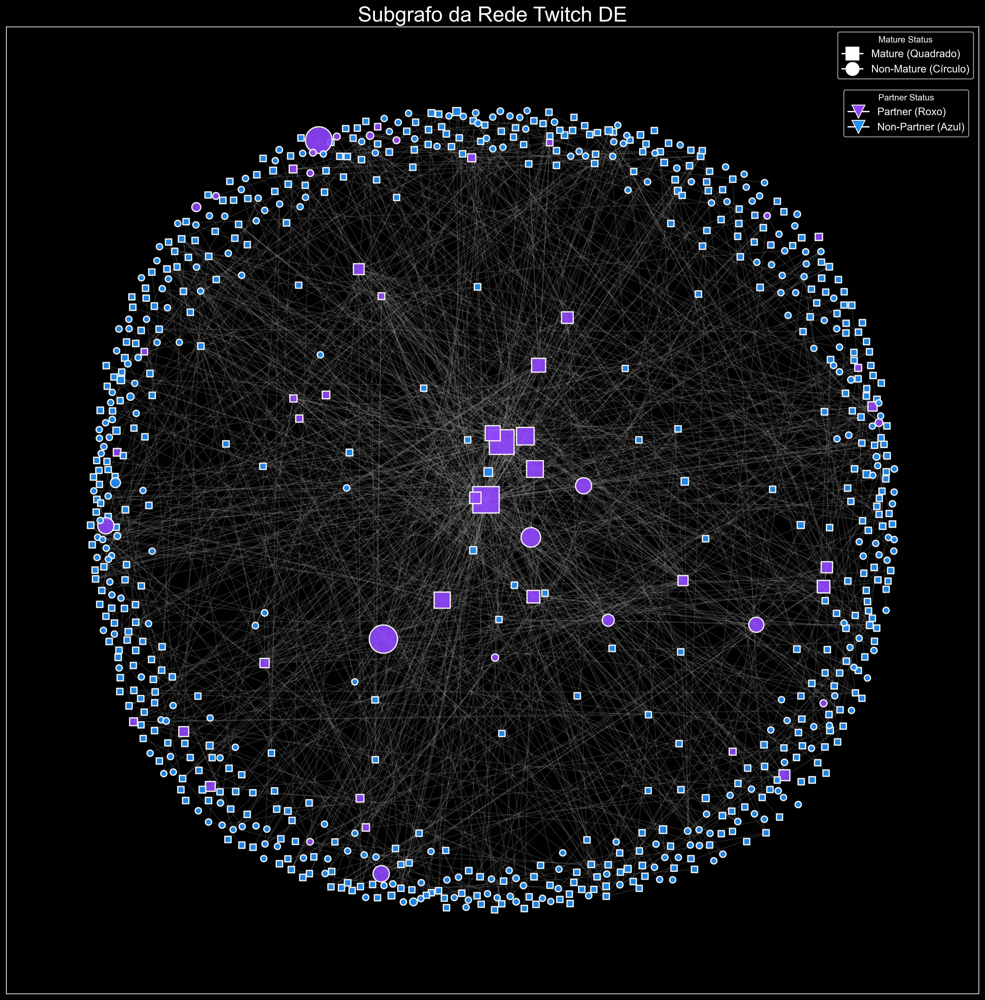

In [55]:
# Definir a percentagem de nós do grafo a utilizar
PercNodes = 8

TwitchVisualization.seeGraph(base_dir, edgePath, targetPath, PercNodes, country)

### Histograma das Variáveis

In [56]:
output_dir_hist = base_dir / 'docs' / "Imagens"
hist_folder = TwitchGraphs.create_subfolder('Histograms', output_dir_hist)

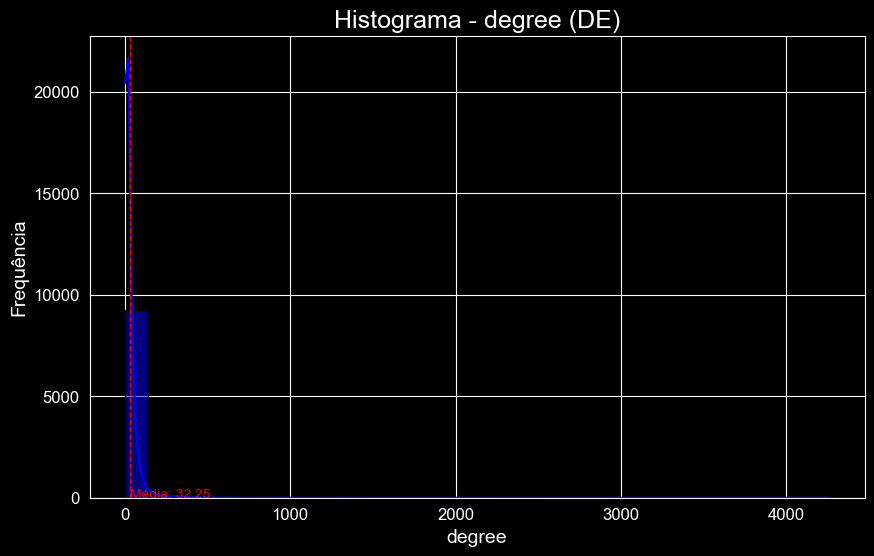

In [57]:
TwitchGraphs.plot_histogram(df = df, column_name = 'degree', color = 'blue', country = country, output_dir = output_dir_hist)

### PieChart das variáveis

In [58]:
output_dir_pie = base_dir / 'docs' / "Imagens"
piechart_folder = TwitchGraphs.create_subfolder('PieCharts', output_dir)

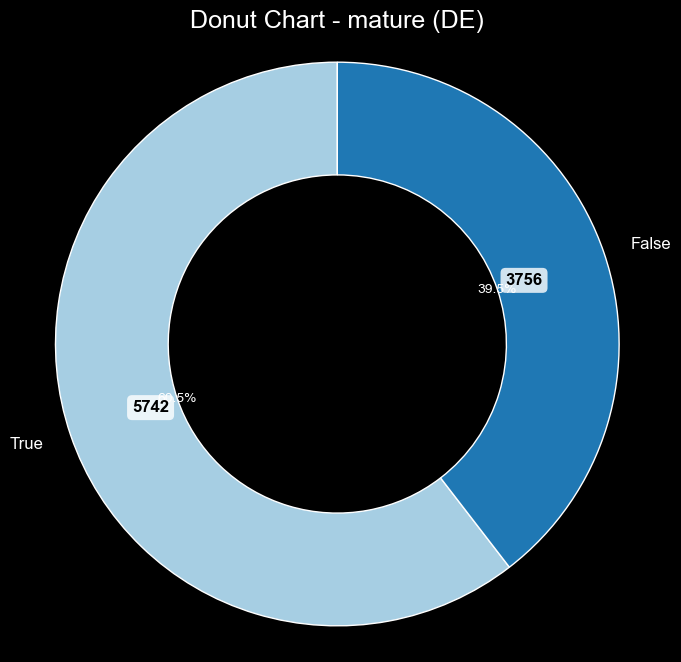

In [59]:
TwitchGraphs.plot_pie_chart(df = df, column_name = 'mature', country = country, output_dir = output_dir)

### Correlações

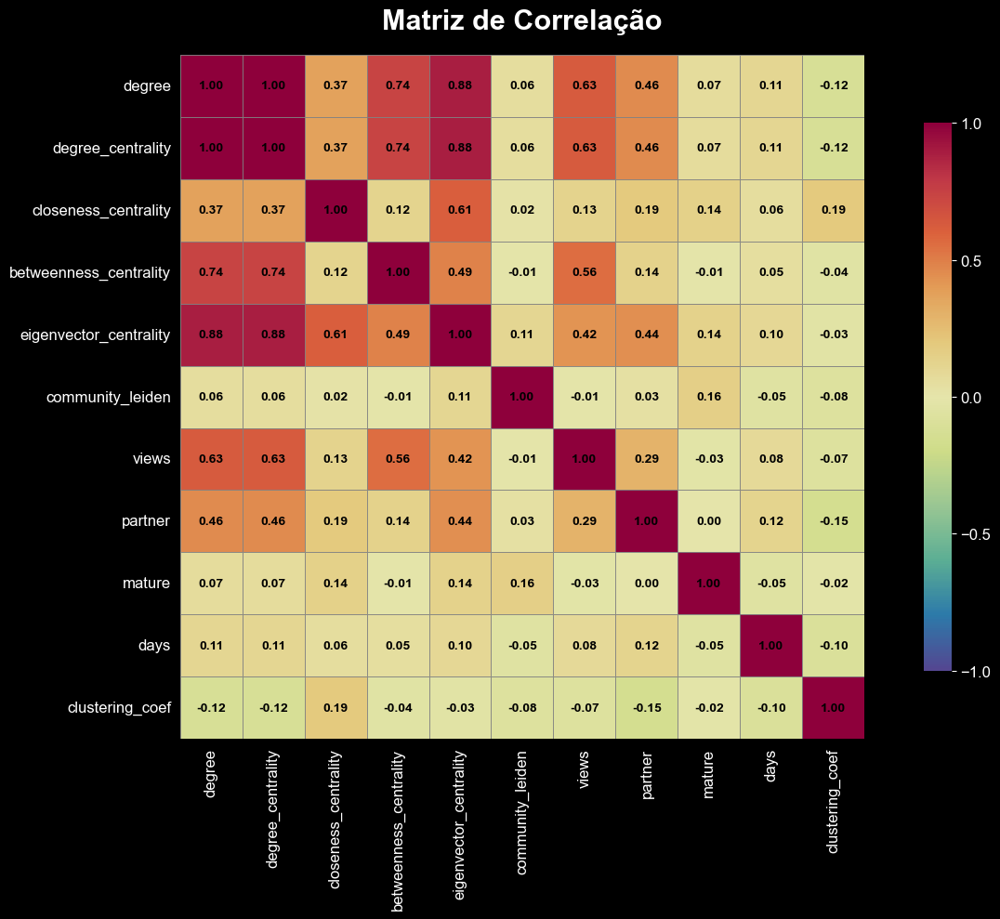

Imagem salva em: C:\Users\diogo\Desktop\ARA\Projeto\Twitch\docs\Imagens\CorrPlot\matriz_correlacao_DE.png


In [60]:
correlations.get_correlations(country)